In [1]:
%load_ext autoreload
%autoreload 2

In [44]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

In [45]:
#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)



#general
import torch
import os
from copy import deepcopy
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names

In [46]:
from circuit_pruner.data_loading import rank_image_data
import torch.utils.data as data

test_loader = data.DataLoader(rank_image_data(config.data_path,
                                            config.preprocess,
                                            label_file_path = config.label_file_path,class_folders=True),
                                            batch_size=1,
                                            shuffle=False,
                              )

In [30]:
criterion = nn.CrossEntropyLoss()

In [31]:
epsilons = [0, .05, .1, .15, .2, .25, .3]

In [32]:
# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    #perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

In [35]:
def test( model, device, test_loader, epsilon ):

    # Accuracy counter
    correct = 0
    adv_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, dont bother attacking, just move on
        if init_pred.item() != target.item():
            continue

        # Calculate the loss
        loss = criterion(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect datagrad
        data_grad = data.grad.data

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data, epsilon, data_grad)

        # Re-classify the perturbed image
        output = model(perturbed_data)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        if final_pred.item() == target.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if (epsilon == 0) and (len(adv_examples) < 5):
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print("Epsilon: {}\tTest Accuracy = {} / {} = {}".format(epsilon, correct, len(test_loader), final_acc))

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [37]:
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model, device, test_loader, eps)
    accuracies.append(acc)
    examples.append(ex)

Epsilon: 0	Test Accuracy = 940 / 2000 = 0.47
Epsilon: 0.05	Test Accuracy = 60 / 2000 = 0.03
Epsilon: 0.1	Test Accuracy = 24 / 2000 = 0.012
Epsilon: 0.15	Test Accuracy = 10 / 2000 = 0.005
Epsilon: 0.2	Test Accuracy = 5 / 2000 = 0.0025
Epsilon: 0.25	Test Accuracy = 5 / 2000 = 0.0025
Epsilon: 0.3	Test Accuracy = 3 / 2000 = 0.0015


In [21]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

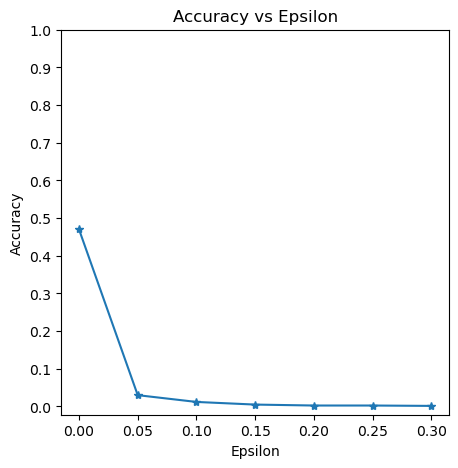

In [38]:
plt.figure(figsize=(5,5))
plt.plot(epsilons, accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, .35, step=0.05))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

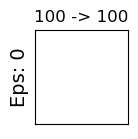

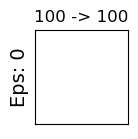

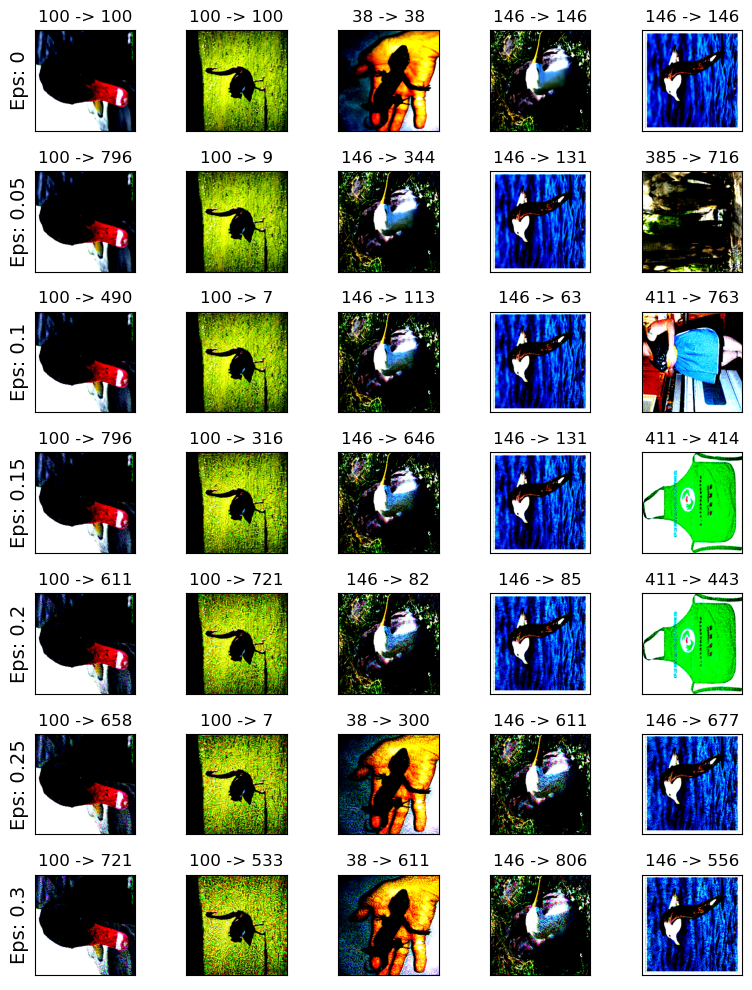

In [51]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8,10))
for i in range(len(epsilons)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(epsilons),len(examples[0]),cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel("Eps: {}".format(epsilons[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        plt.title("{} -> {}".format(orig, adv))
        #plt.imshow(ex, cmap="gray")
        #plt.imshow(ex)
        plt.imshow(np.transpose(ex))
plt.tight_layout()
plt.show()




In [82]:
exs ={}
for i in range(7):
    
    exs[i] = examples[i]

In [83]:
exs

{0: [(100,
   100,
   array([[[-1.5014129 , -1.5014129 , -1.4500387 , ...,  1.8036647 ,
             1.8207895 ,  1.8207895 ],
           [-1.5014129 , -1.4329139 , -1.3644148 , ...,  1.8036647 ,
             1.8379141 ,  1.8036647 ],
           [-1.5014129 , -1.3644148 , -1.2274169 , ...,  1.8036647 ,
             1.8379141 ,  1.8036647 ],
           ...,
           [-1.4842881 , -1.4671633 , -1.4329139 , ..., -0.5253019 ,
            -0.4739276 , -0.45680285],
           [-1.4500387 , -1.4671633 , -1.4671633 , ..., -0.49105233,
            -0.45680285, -0.42255333],
           [-1.4500387 , -1.4671633 , -1.5185376 , ..., -0.49105233,
            -0.43967807, -0.43967807]],
   
          [[-1.4929972 , -1.4404761 , -1.352941  , ...,  1.9908963 ,
             1.9908963 ,  1.9733893 ],
           [-1.457983  , -1.370448  , -1.265406  , ...,  1.9908963 ,
             2.0084033 ,  1.9733893 ],
           [-1.405462  , -1.2829131 , -1.1428571 , ...,  1.9908963 ,
             2.0084033 ,  1

In [4]:
'''
import pickle

pickle.dump(exs,open('adversarial_examples.pkl','wb'))
'''

"\nimport pickle\n\npickle.dump(exs,open('adversarial_examples.pkl','wb'))\n"

In [5]:
import pickle
examples = pickle.load(open('adversarial_examples.pkl','rb'))

In [6]:
examples

{0: [(100,
   100,
   array([[[-1.5014129 , -1.5014129 , -1.4500387 , ...,  1.8036647 ,
             1.8207895 ,  1.8207895 ],
           [-1.5014129 , -1.4329139 , -1.3644148 , ...,  1.8036647 ,
             1.8379141 ,  1.8036647 ],
           [-1.5014129 , -1.3644148 , -1.2274169 , ...,  1.8036647 ,
             1.8379141 ,  1.8036647 ],
           ...,
           [-1.4842881 , -1.4671633 , -1.4329139 , ..., -0.5253019 ,
            -0.4739276 , -0.45680285],
           [-1.4500387 , -1.4671633 , -1.4671633 , ..., -0.49105233,
            -0.45680285, -0.42255333],
           [-1.4500387 , -1.4671633 , -1.5185376 , ..., -0.49105233,
            -0.43967807, -0.43967807]],
   
          [[-1.4929972 , -1.4404761 , -1.352941  , ...,  1.9908963 ,
             1.9908963 ,  1.9733893 ],
           [-1.457983  , -1.370448  , -1.265406  , ...,  1.9908963 ,
             2.0084033 ,  1.9733893 ],
           [-1.405462  , -1.2829131 , -1.1428571 , ...,  1.9908963 ,
             2.0084033 ,  1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0
0


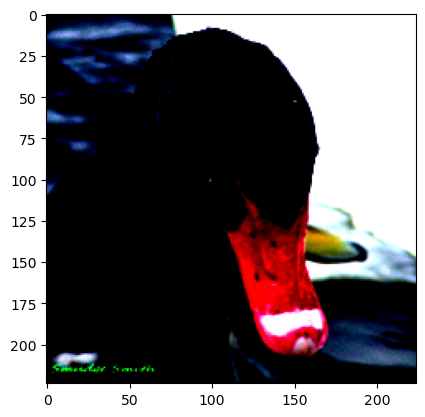

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


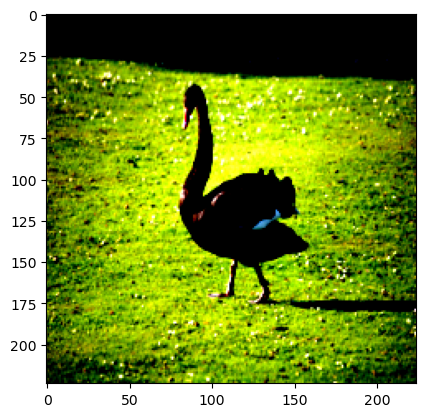

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


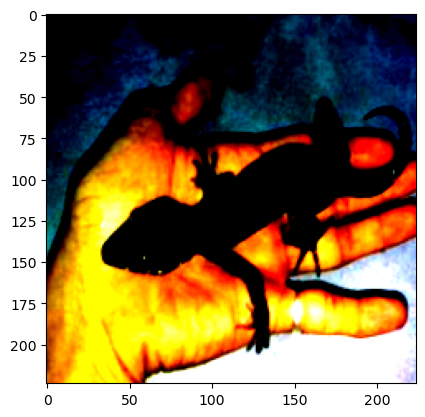

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


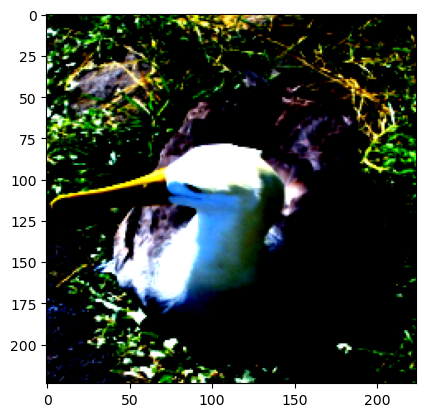

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


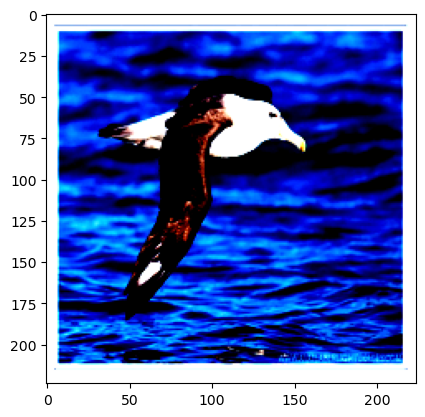

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1
0


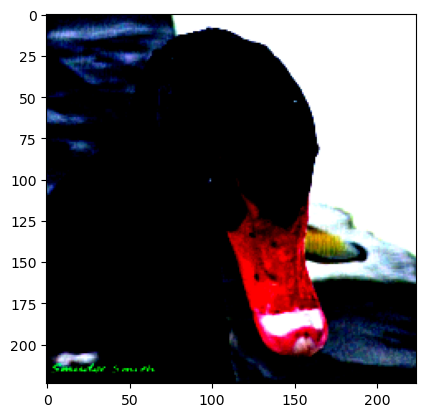

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


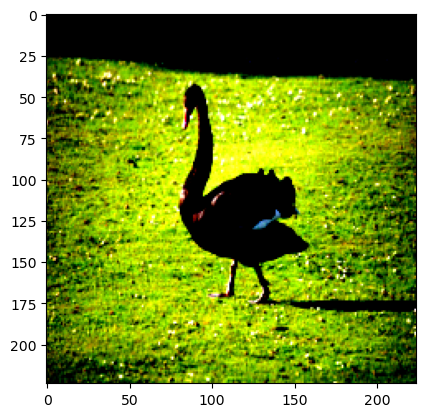

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


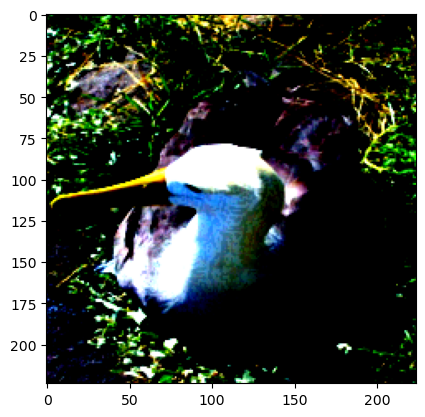

3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


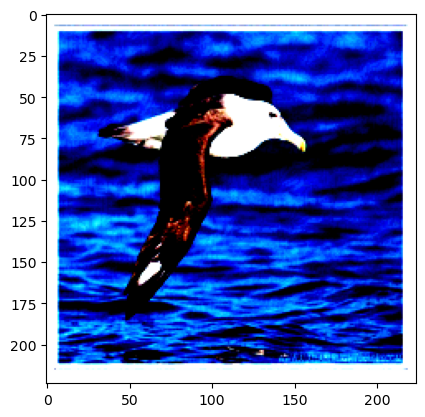

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


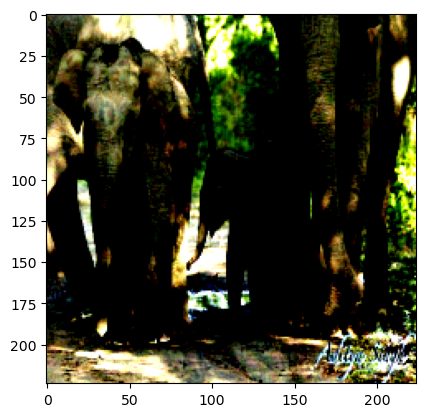

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2
0


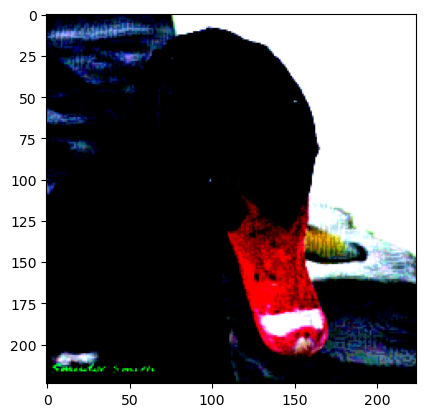

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


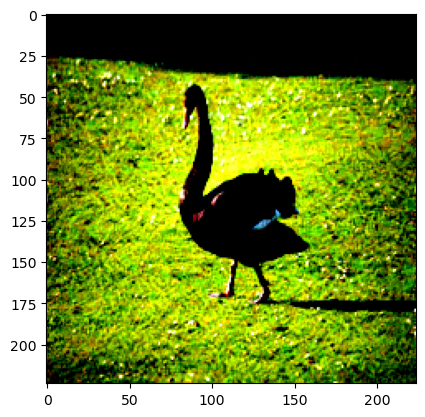

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


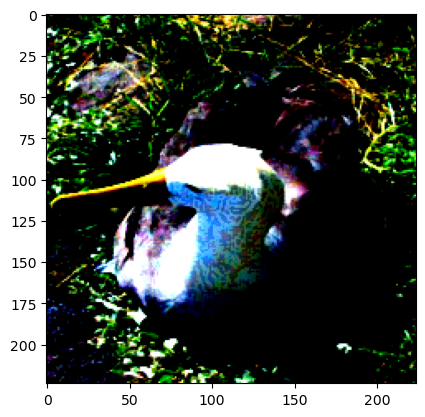

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


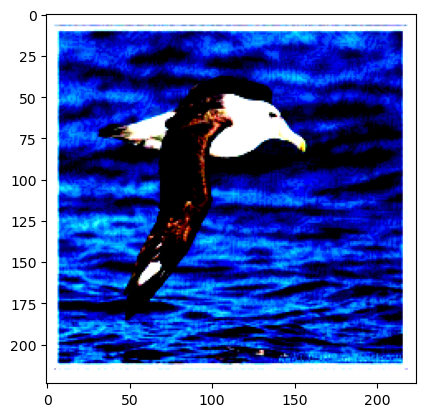

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


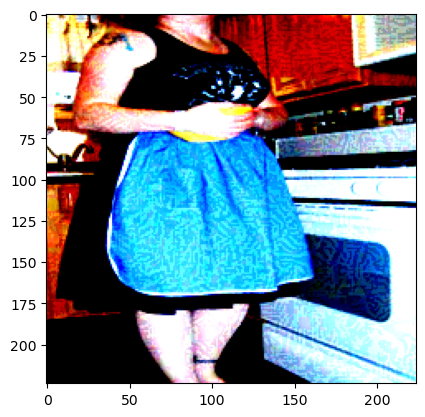

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3
0


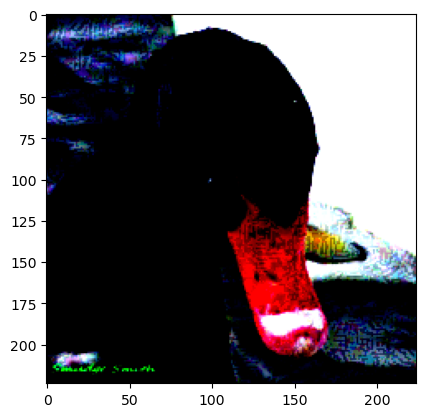

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


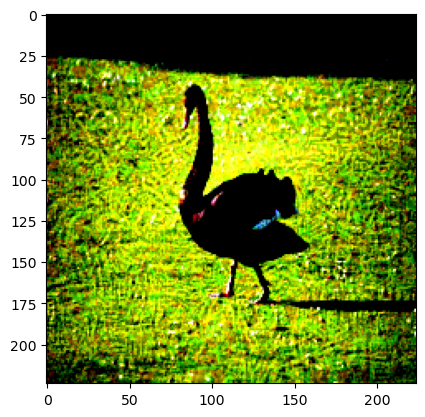

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


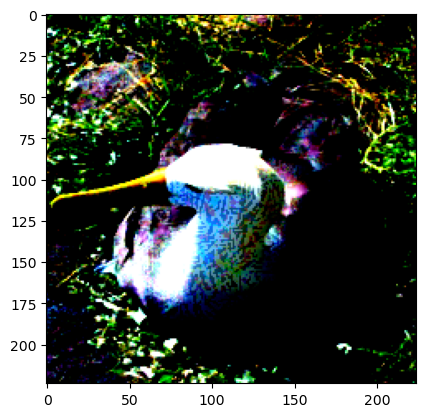

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


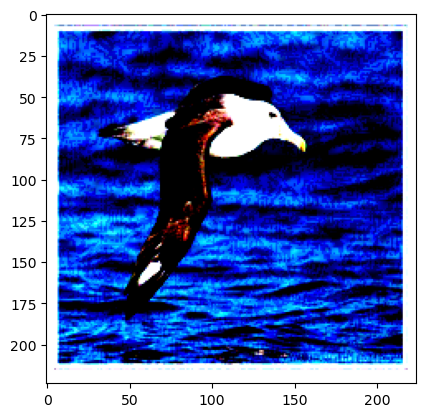

4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


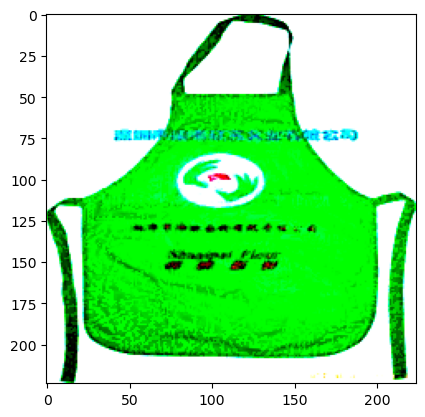

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4
0


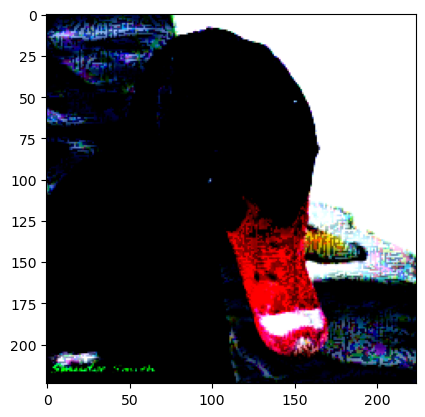

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


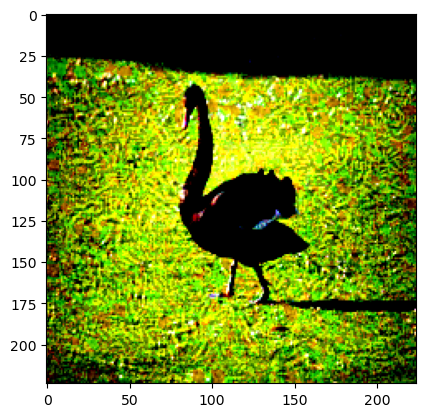

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


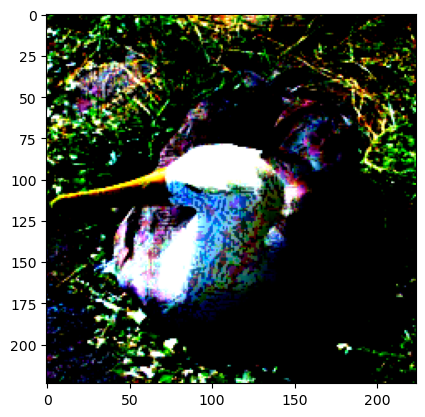

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


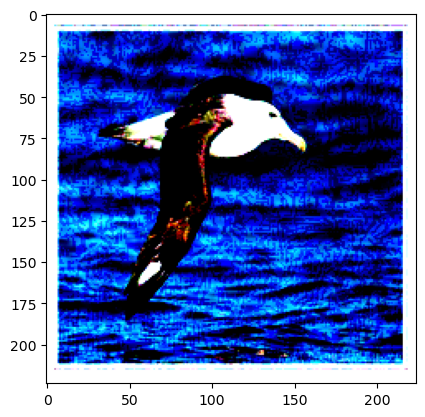

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


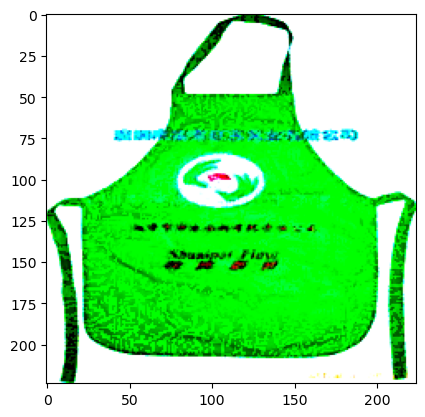

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5
0


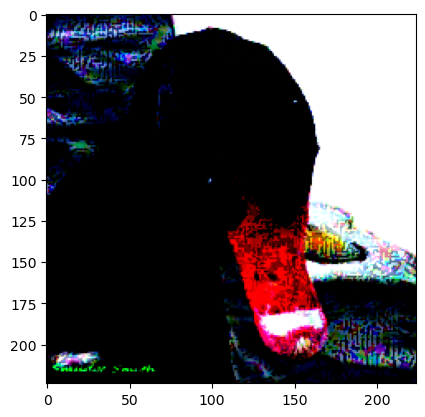

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


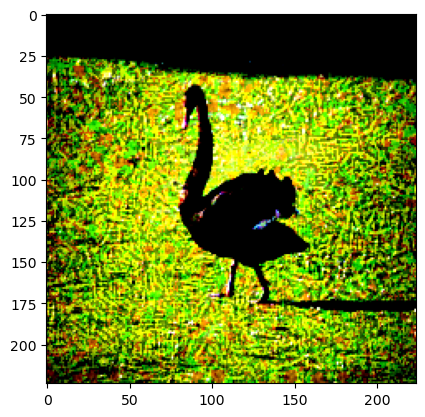

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


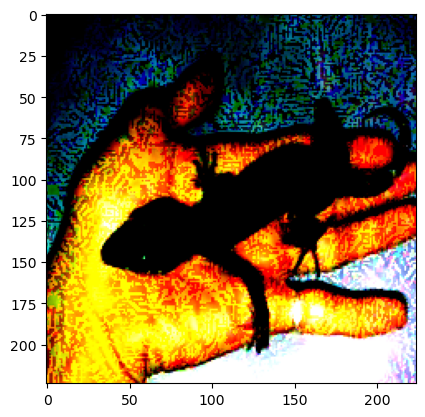

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


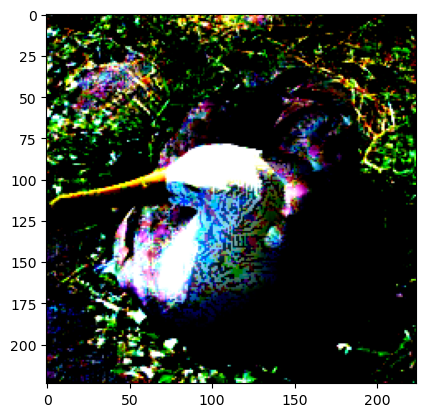

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


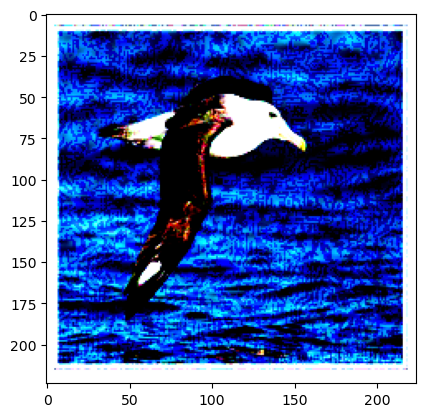

6
0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


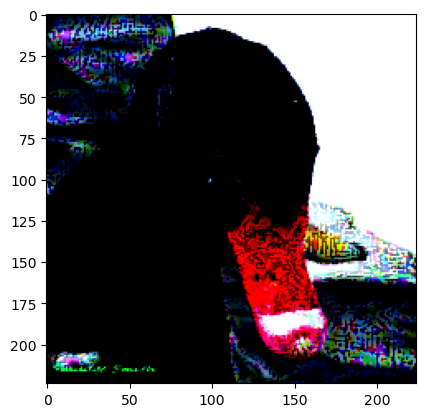

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


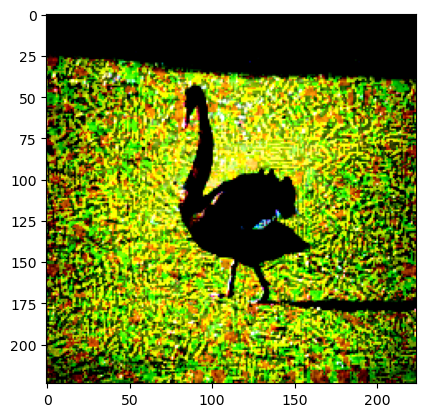

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


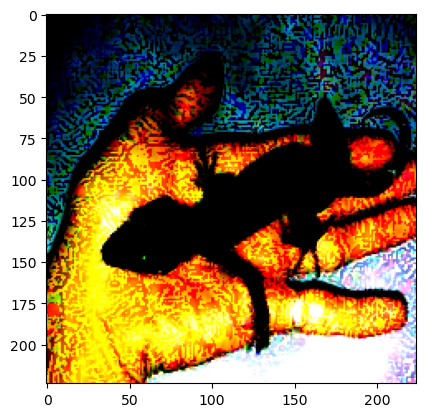

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


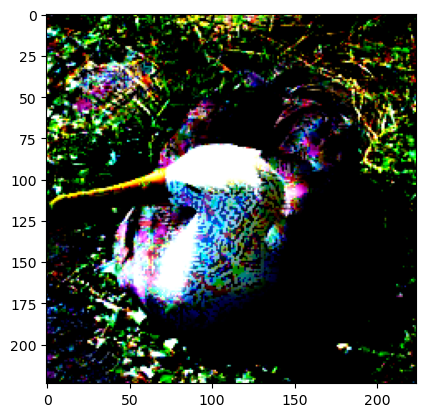

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


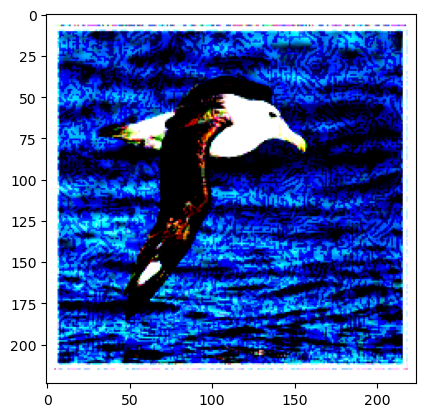

In [11]:
# Plot several examples of adversarial samples at each epsilon


epsilons = [0, .05, .1, .15, .2, .25, .3]

cnt=0
for i in range(len(epsilons)):
    print(i)
    for j in range(len(examples[i])):
        print(j)
        cnt += 1
        #plt.subplot(len(epsilons),len(examples[0]),cnt)
        #plt.xticks([], [])
        #plt.yticks([], [])
        #if j == 0:
        #    plt.ylabel("Eps: {}".format(epsilons[i]), fontsize=14)
        orig,adv,ex = examples[i][j]
        #plt.title("{} -> {}".format(orig, adv))
        #plt.imshow(ex, cmap="gray")
        #plt.imshow(ex)
        plt.imshow(np.transpose(ex,(1,2,0)))
        plt.show()
        
            
        


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 100)


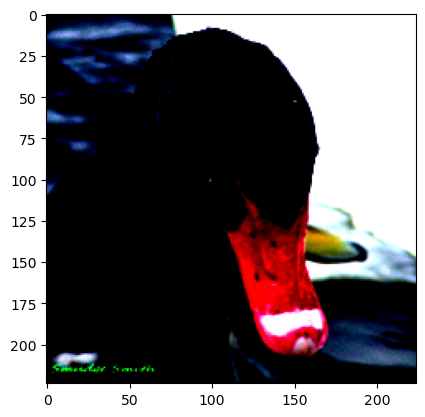

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 796)


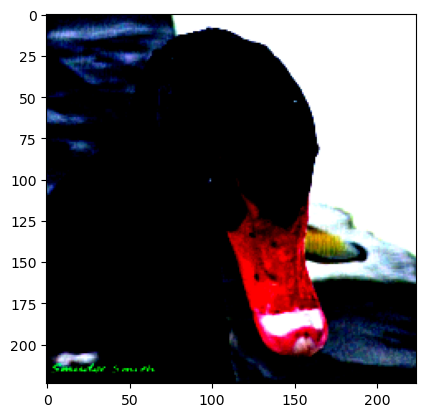

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


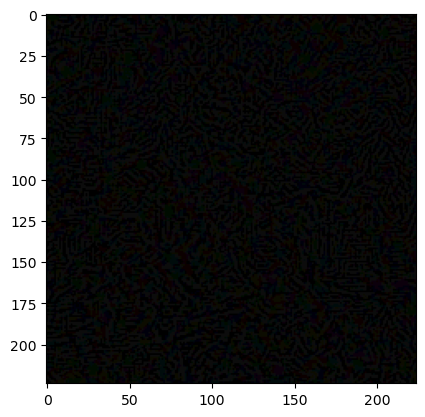

In [26]:
target_exs = [examples[0][0],examples[3][0]]

for t in target_exs:
    print(t[:-1])
    plt.imshow(np.transpose(t[2],(1,2,0)))
    plt.show()
    

diff = np.transpose(target_exs[0][2],(1,2,0)) - np.transpose(target_exs[1][2],(1,2,0))
plt.imshow(diff)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 100)


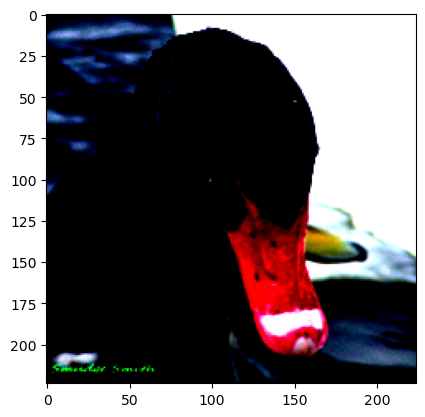

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 796)


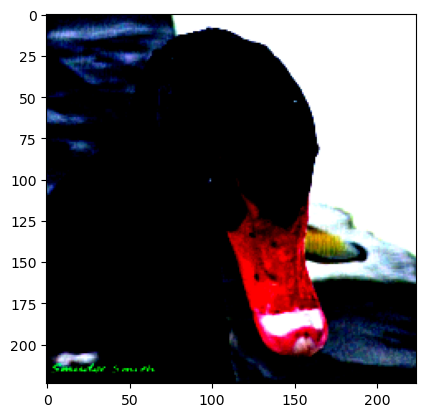

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


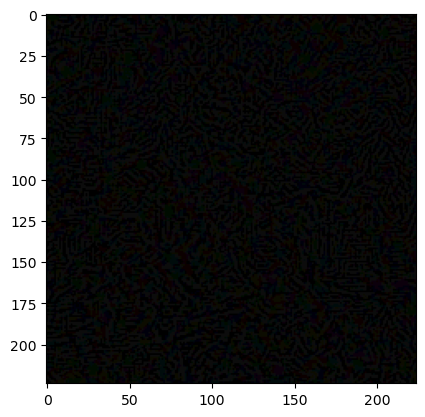

In [41]:
target_exs = [examples[0][0],examples[1][0]]

for t in target_exs:
    print(t[:-1])
    plt.imshow(np.transpose(t[2],(1,2,0)))
    plt.show()
    

diff = np.transpose(target_exs[0][2],(1,2,0)) - np.transpose(target_exs[1][2],(1,2,0))
plt.imshow(diff)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


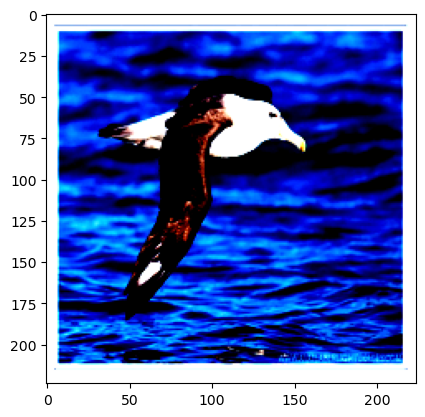

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


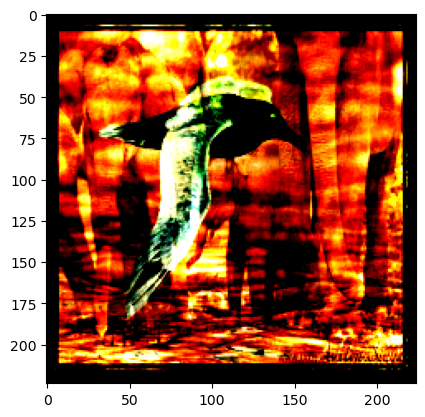

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


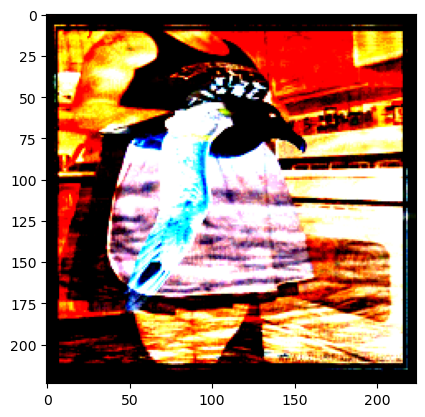

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


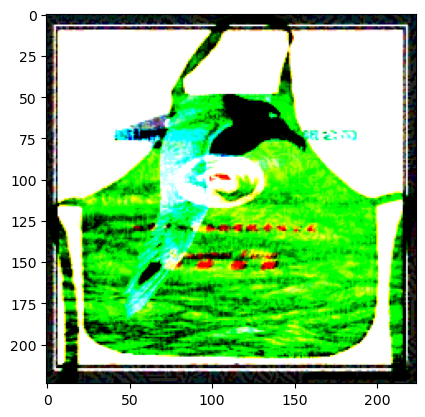

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


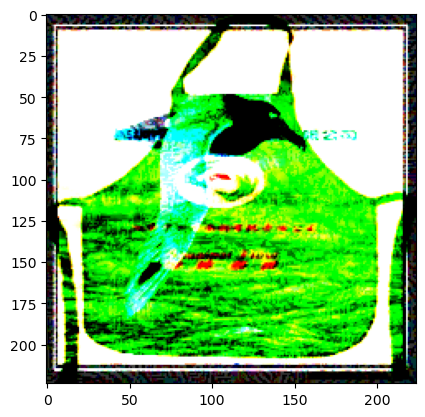

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


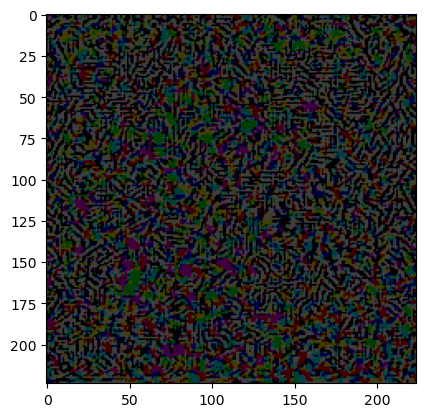

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


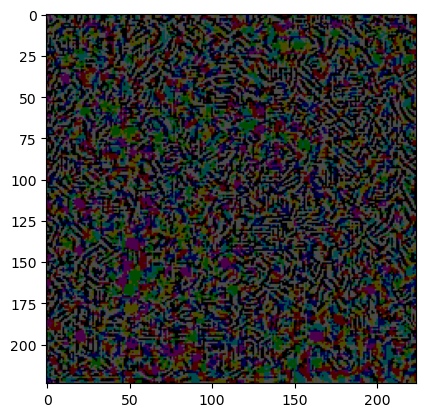

In [38]:
im_index = 4
orig = examples[0][im_index][2]
plt.imshow(np.transpose(orig,(1,2,0)))
plt.show()

for i in range(1,7):
    
    t = examples[i][im_index][2]
    diff = t-orig

    plt.imshow(np.transpose(diff,(1,2,0)))
    plt.show()
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 100)


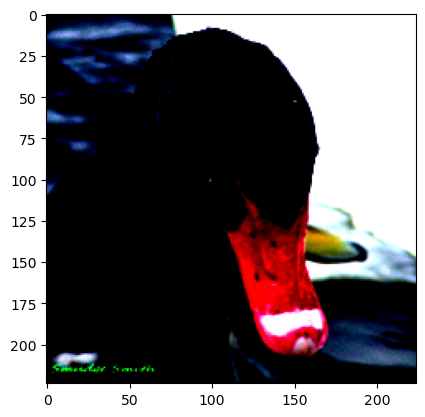

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(100, 796)


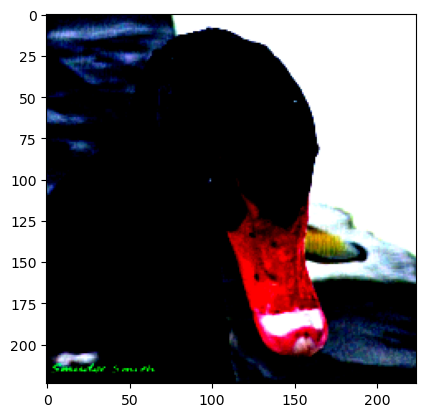

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


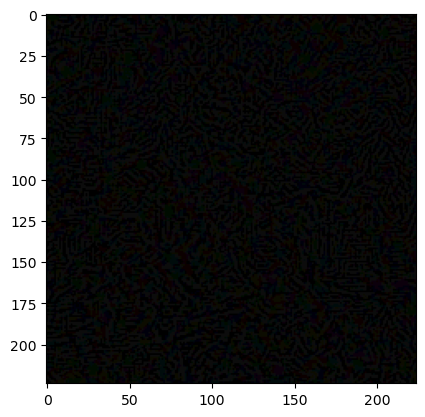

In [47]:
target_exs = [examples[0][0],examples[1][0]]

for t in target_exs:
    print(t[:-1])
    plt.imshow(np.transpose(t[2],(1,2,0)))
    plt.show()
    

diff = np.transpose(target_exs[0][2],(1,2,0)) - np.transpose(target_exs[1][2],(1,2,0))
plt.imshow(diff)
plt.show()

## Start Here

In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

## model

In [11]:
#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)

criterion = nn.CrossEntropyLoss()

#general
import torch
import os
from copy import deepcopy
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names

## params

In [5]:
image_path = 'image_data/imagenet_2/Bernese_mountain_dog/Bernese_mountain_dog_1175.JPEG'
adv_step_size = .1

### dataloader

In [34]:
from circuit_pruner.data_loading import single_image_data
from torch.utils.data import DataLoader



data_loader = DataLoader(single_image_data(image_path,
                                            config.preprocess,
                                            label_file_path = config.label_file_path),
                                            batch_size=1,
                                            shuffle=False
                              )

### adversarial step

In [35]:
# FGSM attack code
def fgsm_attack(image, adv_step_size, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + adv_step_size*sign_data_grad
    # Adding clipping to maintain [0,1] range
    #perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

### gen adversarial examples

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


target
239
initial prediction
239
adversarial prediction
227
output change
90.65864562988281

Images


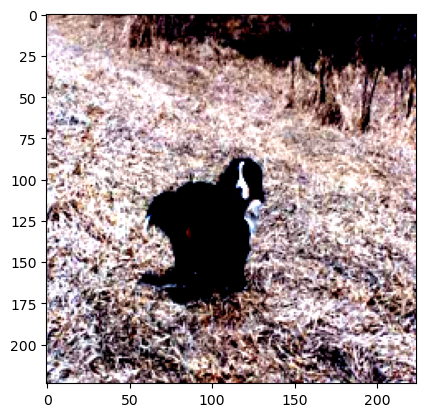

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


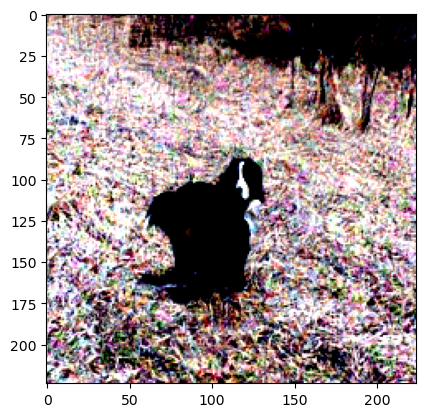

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


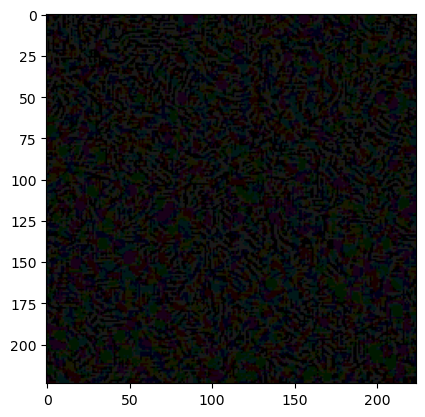

In [43]:

for data, target in data_loader:

    # Send the data and label to the device
    data, target = data.to(device), target.to(device)
    # Set requires_grad attribute of tensor. Important for Attack
    data.requires_grad = True

    # Forward pass the data through the model
    init_output = model(data)
    init_pred = init_output.max(1, keepdim=True)[1] # get the index of the max log-probability


    # Calculate the loss
    
    loss = criterion(init_output, target)

    # Zero all existing gradients
    model.zero_grad()

    # Calculate gradients of model in backward pass
    loss.backward()

    # Collect datagrad
    data_grad = data.grad.data

    # Call FGSM Attack
    perturbed_data = fgsm_attack(data, adv_step_size, data_grad)
    

    
    # Re-classify the perturbed image
    adv_output = model(perturbed_data)
    
    # Check for success
    adv_pred = adv_output.max(1, keepdim=True)[1] # get the index of the max log-probability
    
    perturbed_data = perturbed_data.squeeze().detach().cpu().numpy()
    data = data.squeeze().detach().cpu().numpy()
    diff = perturbed_data-data
    
print('target')
print(int(target))
print('initial prediction')
print(int(init_pred))
print('adversarial prediction')
print(int(adv_pred))

print('output change')
#print(float((init_output.squeeze()).pow(2).sum().sqrt()))
print(float((init_output.squeeze() - adv_output.squeeze()).pow(2).sum().sqrt()))

print('\nImages')
plt.imshow(np.transpose(data,(1,2,0)))
plt.show()
plt.imshow(np.transpose(perturbed_data,(1,2,0)))
plt.show()
plt.imshow(np.transpose(diff,(1,2,0)))
plt.show()


In [44]:
target

tensor([239], device='cuda:0')

In [51]:
from circuit_pruner.force import circuit_FORCE_pruning, circuit_snip_rank
from circuit_pruner.data_loading import simple_data

masks = {}
ranks = {}

im_dict = {'data':data,'perturbed_data':perturbed_data,'diff':diff}

for im in im_dict:
    simple_dataloader = DataLoader(simple_data(im_dict[im],target),
                                        batch_size=1,
                                        shuffle=False
                                        )
    
    ranks[im] = circuit_snip_rank(model, simple_dataloader)


# rank, mask = circuit_FORCE_pruning(model, data_loader, feature_targets = None 
#                                    T=1, keep_ratio=.1, rank_field='max',
#                                    use_abs_ranks=True, return_ranks=True, structure=structure)


    


In [ ]:
from circuit_pruner.utils import get_weight_list

get_weight_list()

In [59]:
i = 2

(ranks['data'][2].detach().cpu() - ranks['perturbed_data'][2].detach().cpu())

tensor([[[[-1.7191e-06, -2.7617e-06, -1.5240e-06],
          [-3.6223e-04, -2.1340e-03, -1.3085e-06],
          [-1.0852e-06, -5.0809e-06, -4.5912e-06]],

         [[-1.4083e-06, -1.9090e-04, -9.5828e-04],
          [-6.8110e-05, -3.3510e-05, -1.0538e-05],
          [-5.9968e-07, -2.6672e-04, -2.4213e-03]],

         [[-7.1564e-07, -1.5227e-07, -4.2313e-07],
          [-7.4540e-06, -2.1077e-06, -1.0005e-06],
          [-1.3288e-05, -1.7564e-05, -1.5593e-05]],

         ...,

         [[-1.0966e-07, -1.5401e-07, -5.1622e-09],
          [-4.7987e-07, -1.0142e-06, -2.7097e-07],
          [-1.3028e-06, -2.2128e-06, -6.6256e-07]],

         [[ 2.1001e-09, -1.3747e-07,  1.4894e-08],
          [-2.8651e-09,  1.0311e-08, -8.0224e-07],
          [-1.3375e-08, -3.8414e-07, -9.7016e-07]],

         [[ 0.0000e+00,  0.0000e+00,  0.0000e+00],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00]]],


        [[[-6.9812e-08, -1.3201e-05,  2.2013e-08],
  

In [60]:
ranks['data'][2].shape

torch.Size([384, 192, 3, 3])

In [ ]:
from circuit_pruner.dissected_Conv2d import set_across_model, set_model_target_node
from circuit_pruner.dissected_Conv2d import get_ranklist_from_dissected_Conv2d_modules, clear_ranks_across_model


structure = 'weights'

positions = ['left','right','top','bottom']

ranks = {}


for position in positions:
    print(position)
    
    rankable_model = dissect_model(deepcopy(spatial_circuits[position]), dissect=True,store_ranks = True, device=device)
    rankable_model.to(device)

    set_model_target_node(rankable_model,layer,0)

    set_across_model(rankable_model,'rank_field','max') 
    #we use max here because our hypothesis was motivated by feature visualizations, 
    #so we are looking for a spatially determined circuit separation with respect to the models large, positive responses

    set_across_model(rankable_model,'absolute_rank',True)
    
    iter_dataloader = iter(imnet2_dataloader)
    iters = len(iter_dataloader)

    #actually extract ranks by running images through model
    clear_ranks_across_model(rankable_model)



    for it in range(iters):

        inputs, label = next(iter_dataloader)
        inputs = inputs.to(device)

        rankable_model.zero_grad()

        try:
            outputs = rankable_model(inputs)
        except:
            pass


    ranks[position] = get_ranklist_from_dissected_Conv2d_modules(rankable_model)
    
    del rankable_model
    torch.cuda.empty_cache()